# Imports

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import scipy as spy
import pygwalker as pyg
import seaborn as sns

salaries_file = './ds_salaries copy.csv'
df = pd.read_csv(salaries_file)

# non pandas way
# for line in fin:
#   print(line.split(",")) returns a list of each data point in line

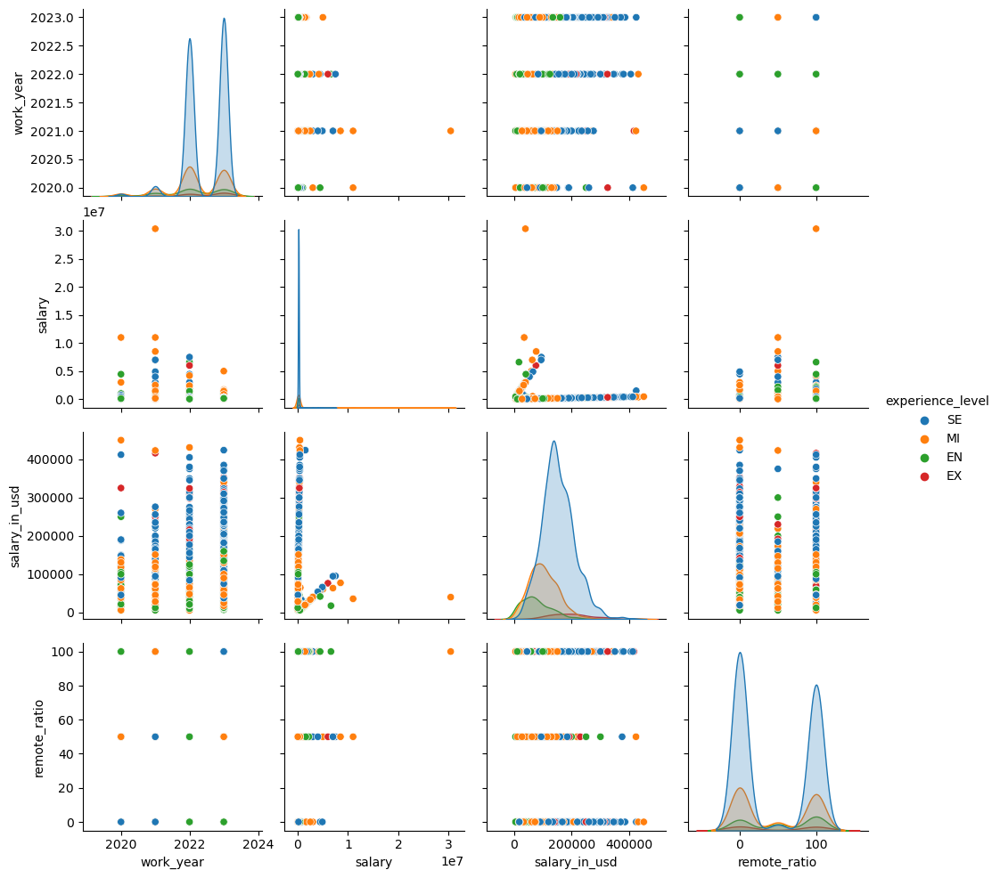

In [4]:
sns.pairplot(df, hue='experience_level')

In [2]:
def pie_chart(dataframe, column):
    freqs = dataframe[column].sort_values().value_counts().to_numpy()
    labels = dataframe[column].sort_values().value_counts().keys().to_numpy()

    plt.pie(freqs, labels=labels, autopct='%1.1f%%')
    plt.title(f'{column}')

def is_statistically_different(pvalue):
    # print(f'data sets are statistically different? = { pvalue < 0.05}')
    return pvalue < 0.05

In [3]:
my_folder = '../../ds examination graphs/only us/'

Only US

In [4]:
useless_cols = [
    'employee_residence', 'company_location', 'salary_currency', 'salary_in_usd'
]
only_us_df = df.loc[(df.employee_residence == 'US') & (df.company_location == 'US') ].drop(useless_cols, axis=1)

## Basic information

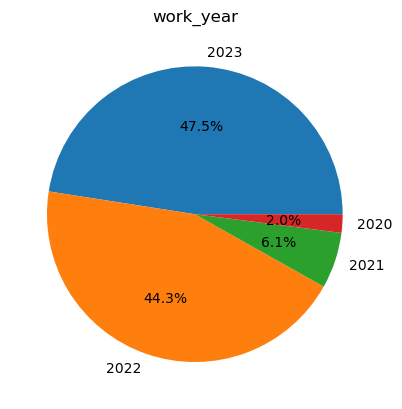

In [ ]:
pie_chart(df, 'work_year')
plt.savefig(f'{my_folder}pie chart of participants by year.svg')

In [5]:
only_us_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2999 entries, 1 to 3753
Data columns (total 7 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   work_year         2999 non-null   int64 
 1   experience_level  2999 non-null   object
 2   employment_type   2999 non-null   object
 3   job_title         2999 non-null   object
 4   salary            2999 non-null   int64 
 5   remote_ratio      2999 non-null   int64 
 6   company_size      2999 non-null   object
dtypes: int64(3), object(4)
memory usage: 187.4+ KB


In [6]:
only_us_df.head()

,work_year,experience_level,employment_type,job_title,salary,remote_ratio,company_size
1,2023,MI,CT,ML Engineer,30000,100,S
2,2023,MI,CT,ML Engineer,25500,100,S
5,2023,SE,FT,Applied Scientist,222200,0,L
6,2023,SE,FT,Applied Scientist,136000,0,L
9,2023,SE,FT,Data Scientist,147100,0,M


In [7]:
only_us_df.tail()

,work_year,experience_level,employment_type,job_title,salary,remote_ratio,company_size
3749,2021,SE,FT,Data Specialist,165000,100,L
3750,2020,SE,FT,Data Scientist,412000,100,L
3751,2021,MI,FT,Principal Data Scientist,151000,100,L
3752,2020,EN,FT,Data Scientist,105000,100,S
3753,2020,EN,CT,Business Data Analyst,100000,100,L


In [8]:
only_us_df.describe()

,work_year,salary,remote_ratio
count,2999.000000,2999.000000,2999.000000
mean,2022.475825,152860.727909,43.847949
std,0.599087,55325.136882,49.341882
min,2020.000000,24000.000000,0.000000
25%,2022.000000,115000.000000,0.000000
50%,2023.000000,145000.000000,0.000000
75%,2023.000000,185000.000000,100.000000
max,2023.000000,450000.000000,100.000000


# PygWalker

In [56]:
# with open('../../ds examination graphs/only us/onlyus.json', 'r') as fin:
#     spec = fin.read()
pyg.walk(only_us_df)

# Relationship between Remote Ratio and Salary

Text(0.5, 1.0, '2023')

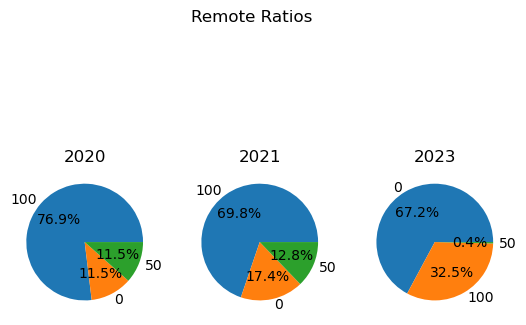

In [63]:
plt.suptitle('Remote Ratios')
plt.subplot(131)
pie_chart(only_us_df.loc[(only_us_df.work_year == 2020)], 'remote_ratio')
plt.title('2020')

plt.subplot(132)
pie_chart(only_us_df.loc[(only_us_df.work_year == 2021)], 'remote_ratio')
plt.title('2021')

plt.subplot(133)
pie_chart(only_us_df.loc[(only_us_df.work_year == 2023)], 'remote_ratio')
plt.title('2023')


<AxesSubplot: ylabel='Frequency'>

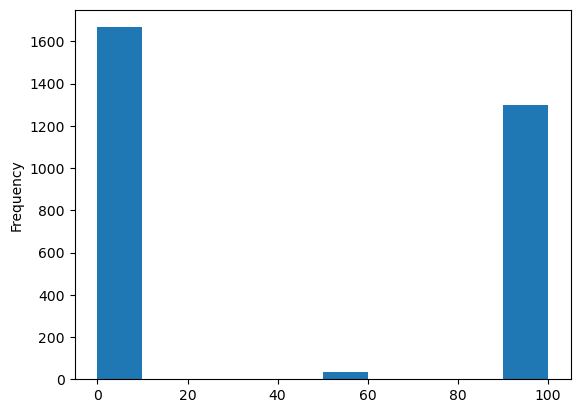

In [25]:
only_us_df.remote_ratio.plot.hist()

## Remote Ratio Over Time


<AxesSubplot: xlabel='work_year'>

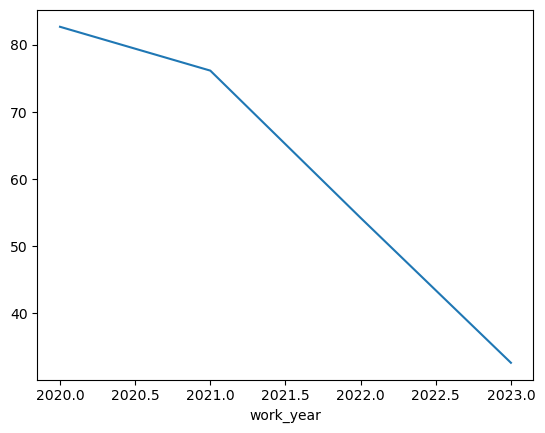

In [122]:
only_us_df.groupby(only_us_df.work_year)['remote_ratio'].mean().plot()

<AxesSubplot: xlabel='work_year', ylabel='remote_ratio'>

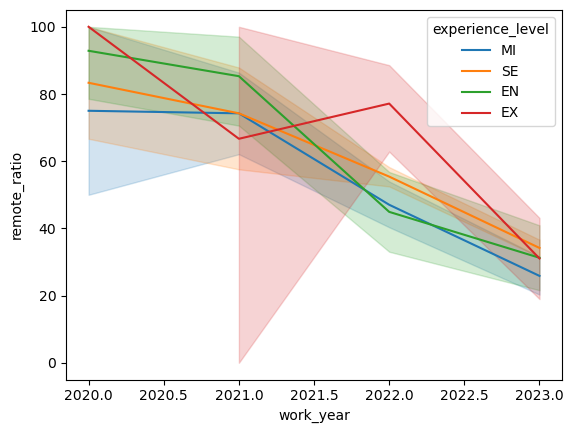

In [182]:
remote_grp = only_us_df.groupby([ only_us_df.remote_ratio , only_us_df.work_year])
mean_salaries_remote = remote_grp.salary.mean().to_numpy()
# remote_grp.mean()
sns.lineplot(
    data=only_us_df,
    x='work_year',
    y='remote_ratio',
    hue='experience_level'
    )

<AxesSubplot: xlabel='work_year', ylabel='remote_ratio'>

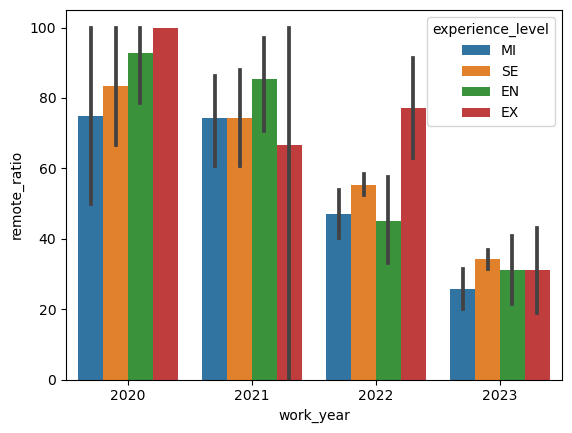

In [68]:
sns.barplot(
    data=only_us_df,
    x='work_year',
    y='remote_ratio',
    hue='experience_level'
    )

INFO: Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO: Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


/home/al-linux/anaconda3/envs/Main/lib/python3.9/site-packages/seaborn/categorical.py:3544: UserWarning: 69.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/al-linux/anaconda3/envs/Main/lib/python3.9/site-packages/seaborn/categorical.py:3544: UserWarning: 70.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/al-linux/anaconda3/envs/Main/lib/python3.9/site-packages/seaborn/categorical.py:3544: UserWarning: 76.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/al-linux/anaconda3/envs/Main/lib/python3.9/site-packages/seaborn/categorical.py:3544: UserWarning: 77.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/al-linux/anaconda3

/home/al-linux/anaconda3/envs/Main/lib/python3.9/site-packages/seaborn/categorical.py:3544: UserWarning: 77.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/al-linux/anaconda3/envs/Main/lib/python3.9/site-packages/seaborn/categorical.py:3544: UserWarning: 78.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/al-linux/anaconda3/envs/Main/lib/python3.9/site-packages/seaborn/categorical.py:3544: UserWarning: 77.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/al-linux/anaconda3/envs/Main/lib/python3.9/site-packages/seaborn/categorical.py:3544: UserWarning: 78.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/al-linux/anaconda3

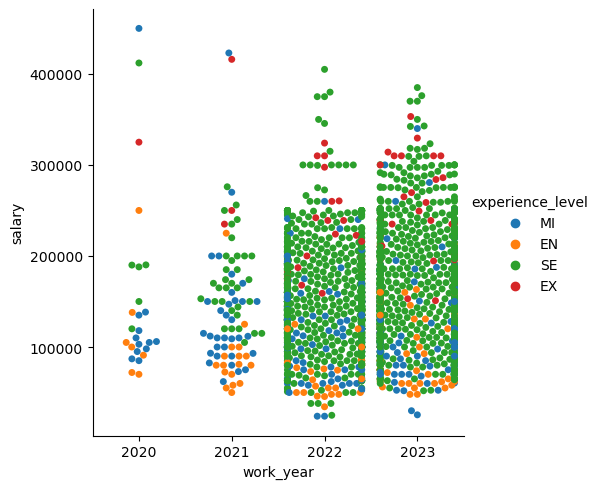

In [189]:
sns.catplot(data=only_us_df, x='work_year', y='salary', hue='experience_level', kind='swarm')

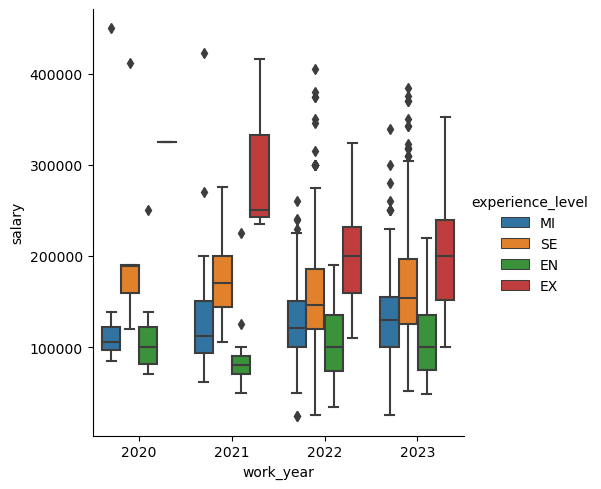

In [204]:
sns.catplot(data=only_us_df, x='work_year', y='salary', hue='experience_level', kind='box')

<AxesSubplot: xlabel='remote_ratio', ylabel='salary'>

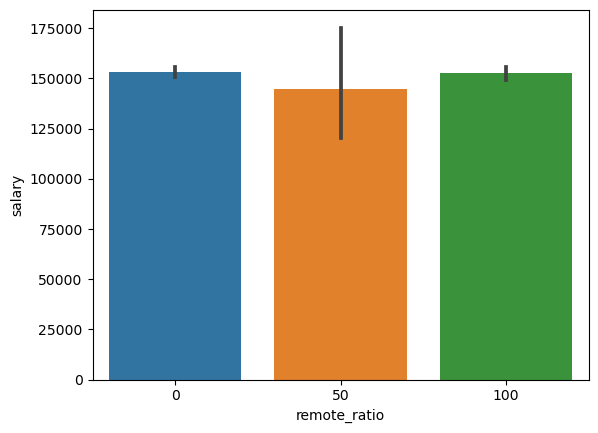

In [245]:
only_us_df.groupby([ only_us_df.remote_ratio, only_us_df.work_year ])
sns.barplot(data=only_us_df, x='remote_ratio', y='salary')

salary vs year, for each remote ratio   
over only for US companies and US employees

<AxesSubplot: xlabel='work_year', ylabel='salary'>

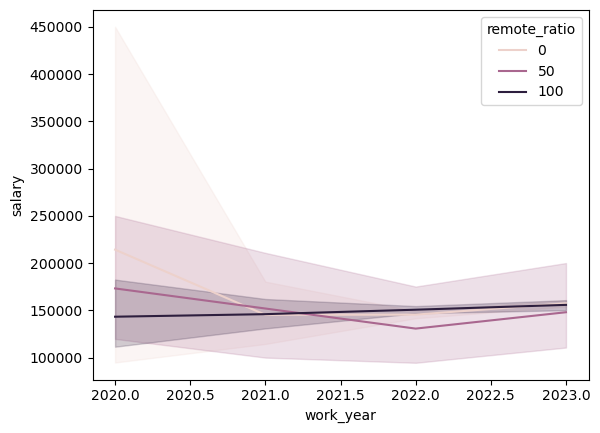

In [93]:
# only_us_df.groupby(only_us_df.work_year)['salary'].mean().plot()
sns.lineplot(
    data=only_us_df,
    x='work_year',
    y='salary',
    hue='remote_ratio'
    # kind='line'
)

salary vs year, for each remote ratio   
over whole dataset

<AxesSubplot: xlabel='work_year', ylabel='salary_in_usd'>

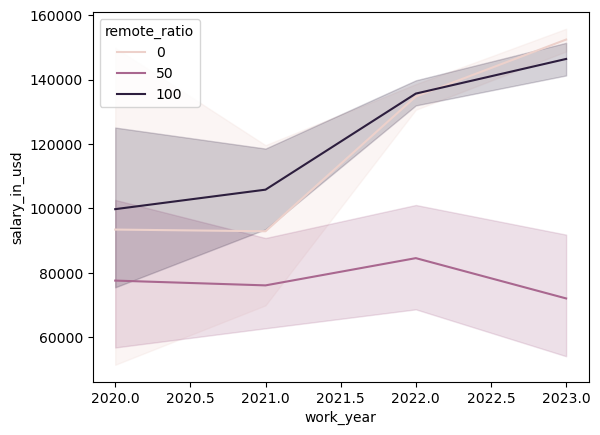

In [91]:
sns.lineplot(
    data=df,
    x='work_year',
    y='salary_in_usd',
    hue='remote_ratio'
    # kind='line'
)

## Mean salary vs remote_ratio, work_year

Text(0, 0.5, 'mean salary (USD)')

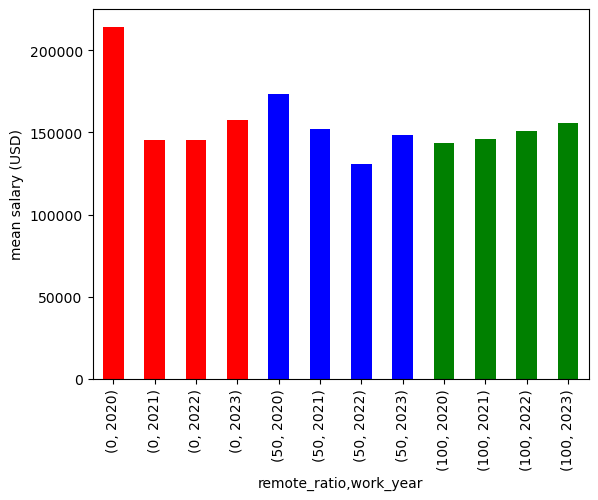

In [69]:
only_us_df.groupby([ only_us_df.remote_ratio, only_us_df.work_year])['salary'].mean().plot.bar(color=['r']*4+['b']*4+['g']*4)
plt.ylabel('mean salary (USD)')

### Looking at all of dataset

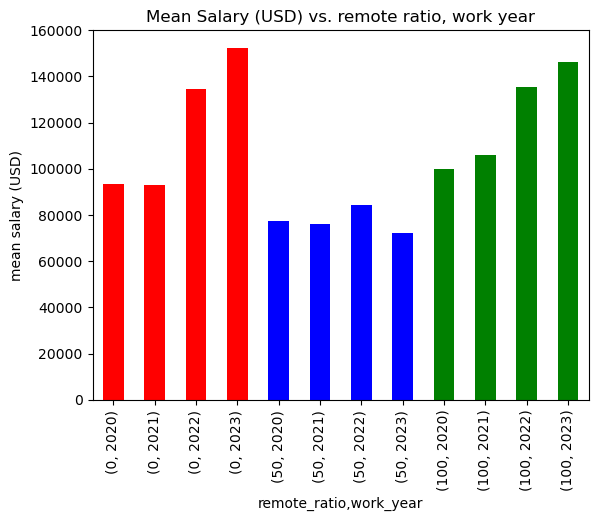

In [110]:
df.groupby([ df.remote_ratio, df.work_year])['salary_in_usd'].mean().plot.bar(color=['r']*4+['b']*4+['g']*4)
plt.ylabel('mean salary (USD)')
plt.title('Mean Salary (USD) vs. remote ratio, work year')

plt.savefig(f'{my_folder}mean salary vs remoteratio_workyear.svg')

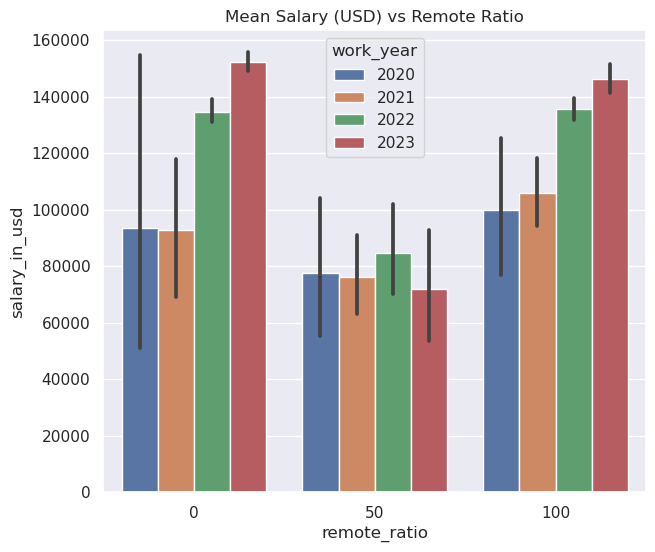

In [130]:
sns.set(rc={"figure.figsize" : (7,6)})
ax = sns.barplot(
    data=df,
    x='remote_ratio',
    y='salary_in_usd',
    hue='work_year',
)
plt.title('Mean Salary (USD) vs Remote Ratio')
plt.savefig(f'{my_folder}mean salary vs remote ratio over time.svg')

### The rest

Text(0, 0.5, 'median salary (USD)')

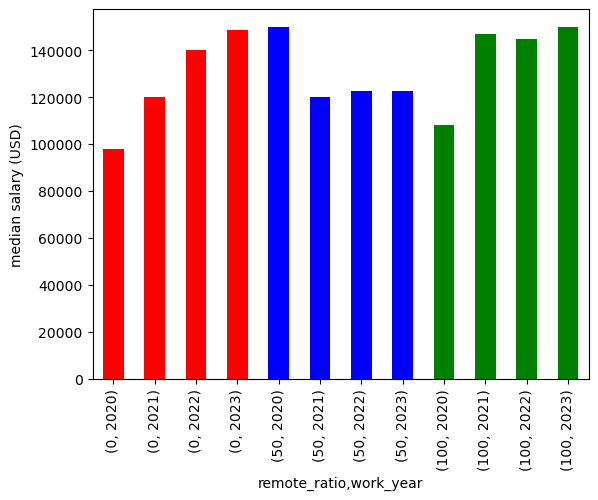

In [70]:

only_us_df.groupby([ only_us_df.remote_ratio, only_us_df.work_year])['salary'].median().plot.bar(color=['r']*4+['b']*4+['g']*4)
plt.ylabel('median salary (USD)')

Text(0, 0.5, 'SEM salary (USD)')

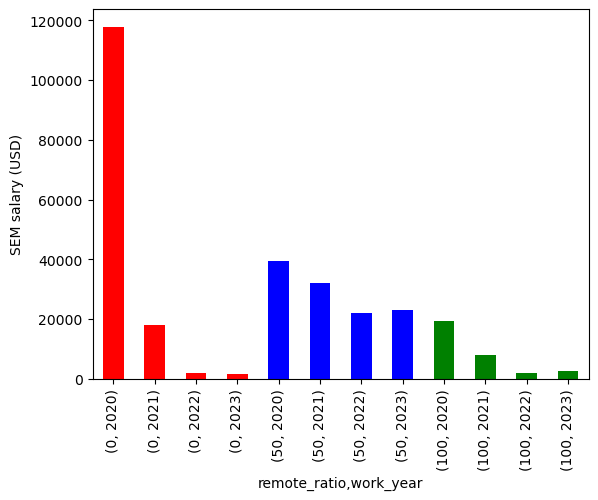

In [72]:

only_us_df.groupby([ only_us_df.remote_ratio, only_us_df.work_year])['salary'].sem().plot.bar(color=['r']*4+['b']*4+['g']*4)
plt.ylabel('SEM salary (USD)')

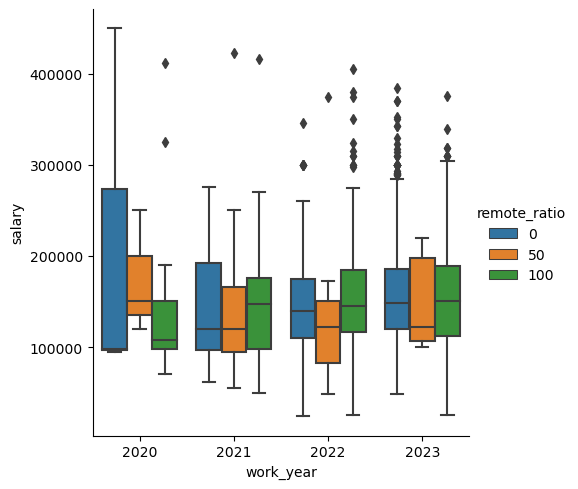

In [249]:
sns.catplot(data=only_us_df, x='work_year', y='salary', hue='remote_ratio', kind='box')

Distribution of salaries

<AxesSubplot: xlabel='salary', ylabel='Count'>

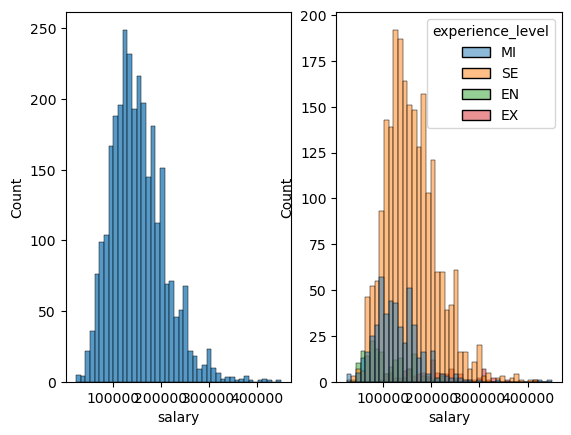

In [278]:
plt.subplot(121)
sns.histplot(data=only_us_df, x='salary')

plt.subplot(122)
sns.histplot(data=only_us_df, x='salary', hue='experience_level')

<AxesSubplot: xlabel='experience_level', ylabel='salary_in_usd'>

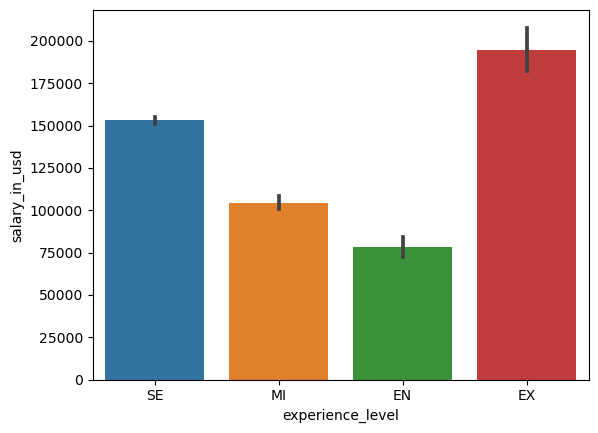

In [8]:
sns.barplot(
    data=df,
    x='experience_level',
    y='salary_in_usd'
)

603009.2596051192


<AxesSubplot: ylabel='salary'>

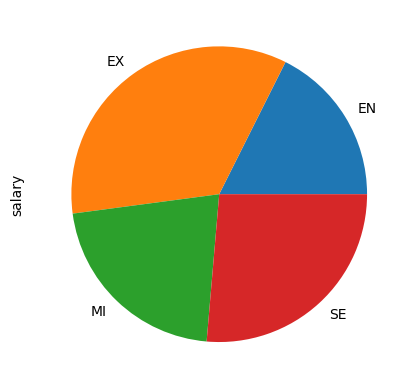

In [286]:
means =  only_us_df.groupby(only_us_df.experience_level)['salary'].mean()
print(means.sum() )

means.plot.pie()

# Salary Over Time

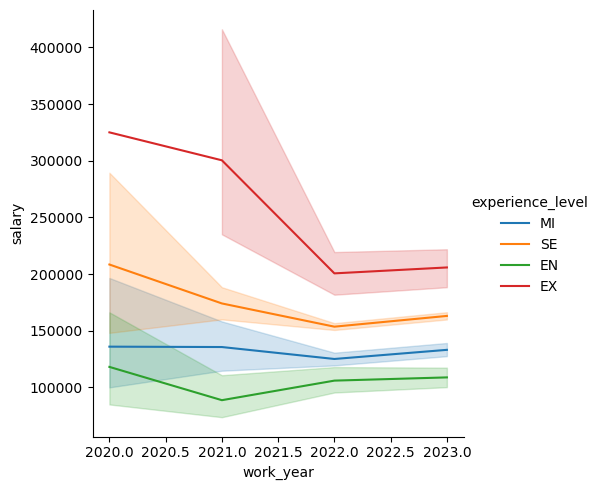

In [290]:
sns.relplot(
    data=only_us_df,
    x='work_year',
    y='salary',
    hue='experience_level',
    kind='line'
)

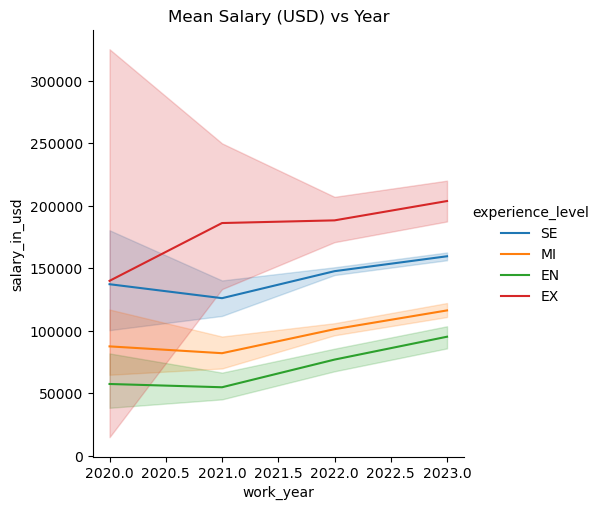

In [7]:
sns.relplot(
    data=df,
    x='work_year',
    y='salary_in_usd',
    hue='experience_level',
    kind='line'
)
plt.title("Mean Salary (USD) vs Year")
plt.savefig(f'{my_folder}mean salary vs year hue exp.svg')

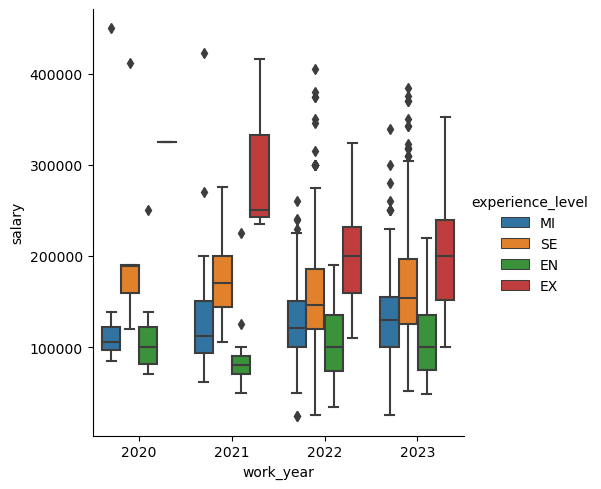

In [291]:

sns.catplot(
    data=only_us_df,
    x='work_year',
    y='salary',
    hue='experience_level',
    kind='box'
)

## ANOVA on salaries in each remote group 

### Bad Idea

In [41]:
rm_yr_grp = only_us_df.groupby([only_us_df.remote_ratio])

salaries0 = rm_yr_grp.get_group(0).salary
salaries50 = rm_yr_grp.get_group(50).salary
salaries100 = rm_yr_grp.get_group(100).salary
pvalue = spy.stats.f_oneway(salaries0, salaries50, salaries100)[1]
print(f'data sets are statistically different? = { pvalue < 0.05}')

data sets are statistically different? = False


In [62]:
salaries0.sem()

1323.4614264679726

# 2 sample t-test on each set of salaries from 0 and 50+100 from each year

## 2020

In [4]:
rm_yr_grp = only_us_df.groupby([ only_us_df.remote_ratio , only_us_df.work_year])
salaries_rm0_2020 = rm_yr_grp.get_group((0,2020)).salary
salaries_rm150_2020 = pd.concat([ rm_yr_grp.get_group((50,2020)), rm_yr_grp.get_group((100,2020)) ]).salary
is_statistically_different( spy.stats.ttest_ind(salaries_rm0_2020, salaries_rm150_2020)[1] )



False

In [102]:
salaries_rm0_2020

2118     95000
3522    450000
3691     98000
Name: salary, dtype: int64

That's only 3 datapoints

In [105]:
print(salaries_rm0_2020.var() / salaries_rm150_2020.var())

6.003628151430496


Include all non-US participants

In [86]:
df_rm_yr_grp = df.groupby([df.remote_ratio, df.work_year])
salaries_rm0_2020 = df_rm_yr_grp.get_group((0,2020)).salary_in_usd
salaries_rm150_2020 = pd.concat([  df_rm_yr_grp.get_group((50,2020))  , df_rm_yr_grp.get_group((100, 2020))]).salary_in_usd

pvalue_20 =  spy.stats.ttest_ind(salaries_rm0_2020, salaries_rm150_2020)[1] 
is_statistically_different(pvalue_20)


False

## 2021

In [87]:
df_rm_yr_grp = df.groupby([df.remote_ratio, df.work_year])
salaries_rm0_2021 = df_rm_yr_grp.get_group((0,2021)).salary_in_usd
salaries_rm150_2021 = pd.concat([  df_rm_yr_grp.get_group((50,2021))  , df_rm_yr_grp.get_group((100, 2021))]).salary_in_usd

pvalue_21 =  spy.stats.ttest_ind(salaries_rm0_2021, salaries_rm150_2021)[1] 
is_statistically_different(pvalue_21)

False

## 2022

In [88]:

df_rm_yr_grp = df.groupby([df.remote_ratio, df.work_year])
salaries_rm0_2022 = df_rm_yr_grp.get_group((0,2022)).salary_in_usd
salaries_rm150_2022 = pd.concat([  df_rm_yr_grp.get_group((50,2022))  , df_rm_yr_grp.get_group((100, 2022))]).salary_in_usd

pvalue_22 =  spy.stats.ttest_ind(salaries_rm0_2022, salaries_rm150_2022)[1] 
is_statistically_different(pvalue_22)

False

## 2023

In [89]:

df_rm_yr_grp = df.groupby([df.remote_ratio, df.work_year])
salaries_rm0_2023 = df_rm_yr_grp.get_group((0,2023)).salary_in_usd
salaries_rm150_2023 = pd.concat([  df_rm_yr_grp.get_group((50,2023))  , df_rm_yr_grp.get_group((100, 2023))]).salary_in_usd

pvalue_23 =  spy.stats.ttest_ind(salaries_rm0_2023, salaries_rm150_2023)[1] 
is_statistically_different(pvalue_23)

True

## Roundup

In [90]:
print(f'{pvalue_20 = :0.3f}\t{is_statistically_different(pvalue_20) = }')
print(f'{pvalue_21 = :0.3f}\t{is_statistically_different(pvalue_21) = }')
print(f'{pvalue_22 = :0.3f}\t{is_statistically_different(pvalue_22) = }')
print(f'{pvalue_23 = :0.3f}\t{is_statistically_different(pvalue_23) = }')

pvalue_20 = 0.952	is_statistically_different(pvalue_20) = False
pvalue_21 = 0.913	is_statistically_different(pvalue_21) = False
pvalue_22 = 0.409	is_statistically_different(pvalue_22) = False
pvalue_23 = 0.002	is_statistically_different(pvalue_23) = True


In [85]:
print(f'Are any-remote mean salaries higher than 0 remote mean salaries =  {  salaries_rm150_2023.mean() > salaries_rm0_2023.mean()  }') 

Are any-remote mean salaries higher than 0 remote mean salaries =  True


## Now let's exclude remote_ratio=50

In [100]:
# 2020
# df_rm_yr_grp = df.groupby([df.remote_ratio, df.work_year])
salaries_rm0_2020 = df_rm_yr_grp.get_group((0,2020)).salary
salaries_rm150_2020 =  df_rm_yr_grp.get_group((100, 2020)).salary

pvalue_20 =  spy.stats.ttest_ind(salaries_rm0_2020, salaries_rm150_2020)[1] 
print( is_statistically_different(pvalue_20) )

# 2021
salaries_rm0_2021 = df_rm_yr_grp.get_group((0,2021)).salary
salaries_rm150_2021 =  df_rm_yr_grp.get_group((100, 2021)).salary

pvalue_21 =  spy.stats.ttest_ind(salaries_rm0_2021, salaries_rm150_2021)[1] 
print( is_statistically_different(pvalue_21) )

# 2022
salaries_rm0_2022 = df_rm_yr_grp.get_group((0,2022)).salary
salaries_rm150_2022 =  df_rm_yr_grp.get_group((100, 2022)).salary

pvalue_22 =  spy.stats.ttest_ind(salaries_rm0_2022, salaries_rm150_2022)[1] 
print( is_statistically_different(pvalue_22) )

# 2023
salaries_rm0_2023 = df_rm_yr_grp.get_group((0,2023)).salary
salaries_rm150_2023 =  df_rm_yr_grp.get_group((100, 2023)).salary

pvalue_23 =  spy.stats.ttest_ind(salaries_rm0_2023, salaries_rm150_2023)[1] 
print( is_statistically_different(pvalue_23) )

False
False
True
False


### 0 vs 100 Roundup

In [103]:
print(f'{pvalue_20 = :0.3f}\t{is_statistically_different(pvalue_20) = }')
print(f'{pvalue_21 = :0.3f}\t{is_statistically_different(pvalue_21) = }')
print(f'{pvalue_22 = :0.3f}\t{is_statistically_different(pvalue_22) = }')
print(f'{pvalue_23 = :0.3f}\t{is_statistically_different(pvalue_23) = }')

salaries_rm0_2022.mean() < salaries_rm150_2022.mean()

pvalue_20 = 0.733	is_statistically_different(pvalue_20) = False
pvalue_21 = 0.830	is_statistically_different(pvalue_21) = False
pvalue_22 = 0.034	is_statistically_different(pvalue_22) = True
pvalue_23 = 0.377	is_statistically_different(pvalue_23) = False


True

# Linear regression of remote_ratio=100 Salaries over time

In [5]:
salaries_rm100_20 = df_rm_yr_grp.get_group((100, 2020)).salary
salaries_rm100_21 = df_rm_yr_grp.get_group((100, 2021)).salary
salaries_rm100_22 = df_rm_yr_grp.get_group((100, 2022)).salary
salaries_rm100_23 = df_rm_yr_grp.get_group((100, 2023)).salary

In [10]:
by_yrs = df.groupby(df.remote_ratio).get_group(100).set_index('work_year')

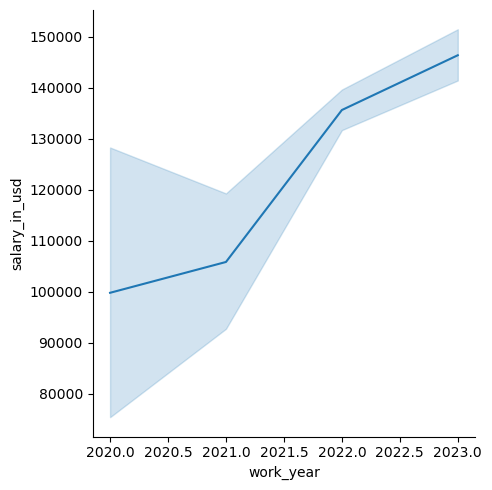

In [122]:
sns.relplot(
    data=by_yrs,
    x='work_year',
    y='salary_in_usd',
    kind='line',
        )

<AxesSubplot: xlabel='work_year'>

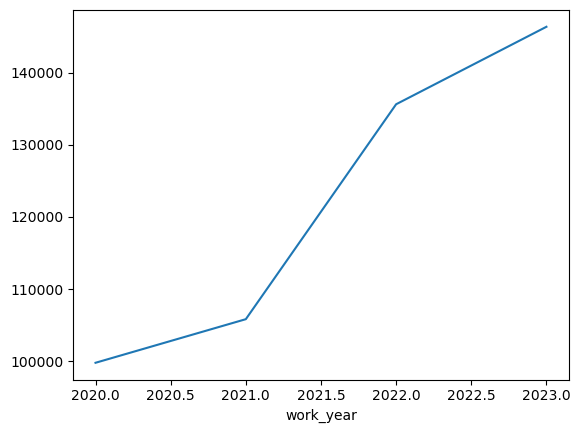

In [11]:
df.groupby(df.remote_ratio).get_group(100).groupby(df.work_year).salary_in_usd.mean().plot()

In [12]:
x = by_yrs.reset_index().work_year
y = by_yrs.salary_in_usd
fit, stats = np.polynomial.polynomial.polyfit(x, y, 1, full=True)

R2 = stats[0][0]


### Do the linreg on the means of the salaries

In [12]:
x = [2020, 2021, 2022, 2023]
y = df.groupby(df.remote_ratio).get_group(100).groupby(df.work_year).salary_in_usd.mean()

fit, stats = np.polynomial.polynomial.polyfit(x, y, 1, full=True)
R2 = stats[0][0]
fit, R2

(array([-3.41767077e+07,  1.69669080e+04]), 97276087.68243635)

f(x) = 16966.908002676308 + -34176707.723003194
[array([97276087.68243635]), 2, array([1.41421351e+00, 3.91080546e-04]), 8.881784197001252e-16]


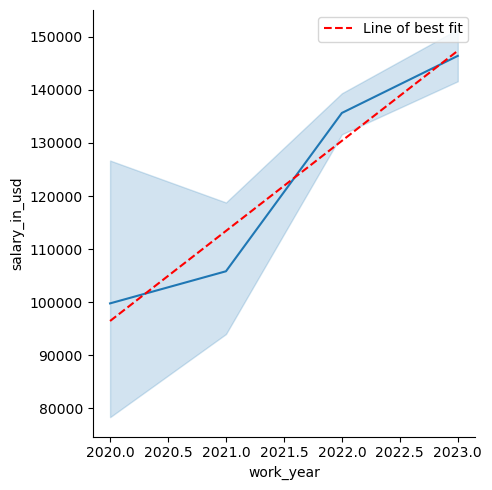

In [13]:
sns.relplot(
    data=by_yrs,
    x='work_year',
    y='salary_in_usd',
    kind='line',
        )

linfit = lambda a : fit[1] * a + fit[0]
best_fit = [ linfit(xi) for xi in x]
plt.plot(x, best_fit, '--r', label='Line of best fit')
plt.legend()

print(f'f(x) = {fit[1]} + {fit[0]}')
print(f'{stats}')



## Using scipy

In [149]:

slope, intercept, r_value, p_value, std_err = spy.stats.linregress(x, y)

print(f'{  is_statistically_different( p_value )  =}')
print(f'{r_value**2 = }')

  is_statistically_different( p_value )  =True
r_value**2 = 0.9366962465752573


f(x) = 16966.908002677792x + -34176707.7230062
R2 = 0.9366962465752573
p_value = 0.03216930893091774


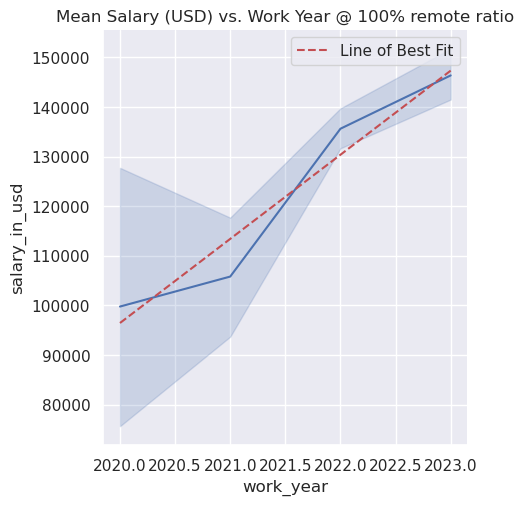

In [150]:

sns.relplot(
    data=by_yrs,
    x='work_year',
    y='salary_in_usd',
    kind='line',
        ).set(title='Mean Salary (USD) vs. Work Year @ 100% remote ratio')

linfit = lambda a : slope*a + intercept
best_fit = [linfit(xi) for xi in x]
plt.plot(x, best_fit, '--r', label='Line of Best Fit')
plt.legend()

print(f'f(x) = {slope}x + {intercept}')
print(f'R2 = {r_value**2}')
print(f'p_value = {p_value}')

plt.savefig('../../ds examination graphs/only us/remote 100 salary linreg.svg')


### Statistically different?

In [65]:

is_statistically_different(p_value)

data sets are statistically different? = True


True

# LinReg on Remote_ratio=0

In [20]:
df_rm0 = df.groupby(df.remote_ratio).get_group(0).set_index('work_year')

In [164]:
# df_rm0.reset_index(inplace=True)
df_rm0.groupby('work_year').salary_in_usd

work_year
2020    77591.238095
2021    76104.407895
2022    84560.870968
2023    72053.500000
Name: salary_in_usd, dtype: float64

f(x) = 21872.156186022145x + -44096204.074600734
R2 = 0.8872805810929164
p_value = 0.0580442785921854


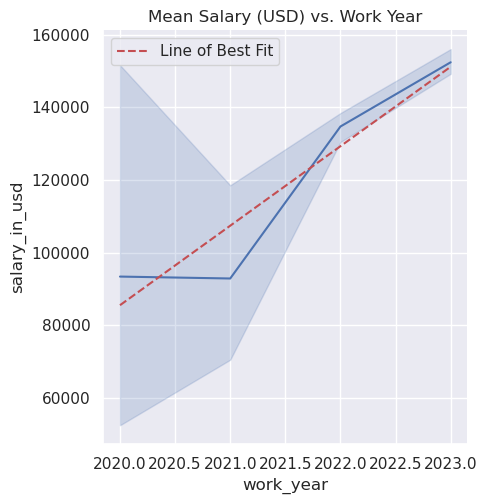

In [171]:

sns.relplot(
    data=df.groupby(df.remote_ratio).get_group(0),
    x='work_year',
    y='salary_in_usd',
    kind='line',
        ).set(title='Mean Salary (USD) vs. Work Year')

x = [2020, 2021, 2022, 2023]
y = df.groupby(df.remote_ratio).get_group(0).groupby(df.work_year).salary_in_usd.mean()


slope, intercept, r_value, p_value, std_err = spy.stats.linregress(x, y)
linfit = lambda a : slope*a + intercept
best_fit = [linfit(xi) for xi in x]

plt.plot(x, best_fit, '--r', label='Line of Best Fit')
plt.legend()

print(f'f(x) = {slope}x + {intercept}')
print(f'R2 = {r_value**2}')
print(f'p_value = {p_value}')

# plt.savefig('../../ds examination graphs/only us/remote 100 salary linreg.svg')


<AxesSubplot: xlabel='work_year'>

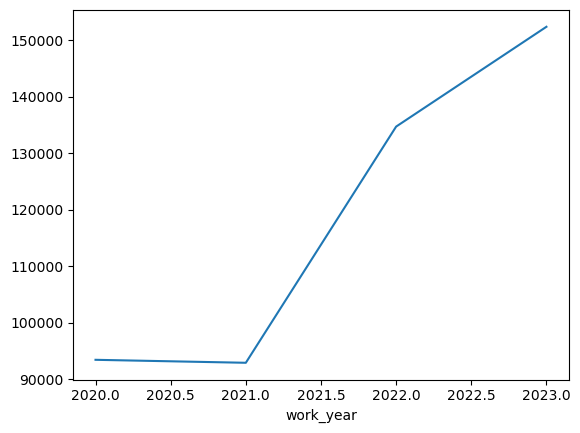

In [29]:
df_rm0.reset_index().groupby('work_year').salary_in_usd.mean().plot()

<AxesSubplot: xlabel='work_year', ylabel='salary_in_usd'>

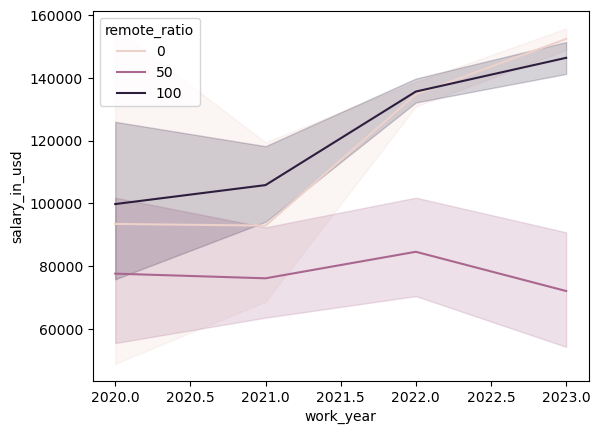

In [31]:
sns.lineplot(
    data=df,
    x='work_year',
    y='salary_in_usd',
    hue='remote_ratio'
)

# Salary vs. remote ratio

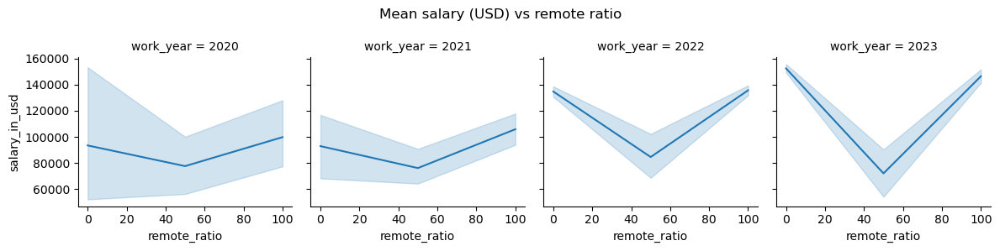

In [5]:
# sns.relplot(
#     data=df.loc[(df.work_year == 2020)],
#     x='remote_ratio',
#     y='salary_in_usd',
#     kind='line',
#     # hue='work_year'
# )
g = sns.FacetGrid(df, col='work_year')
g.fig.suptitle('Mean salary (USD) vs remote ratio')
g.map(sns.lineplot,  'remote_ratio', 'salary_in_usd')

plt.savefig('../../ds examination graphs/only us/salary vs remote ratio over years.svg')

# LinReg of remote_ratio = 50

In [132]:
df_rm50 = df.groupby(df.remote_ratio).get_group(50).set_index('work_year')

f(x) = -815.6751212709175x + 1726464.761888589
R2 = 0.04084147612171473
p_value = 0.7979072586120057


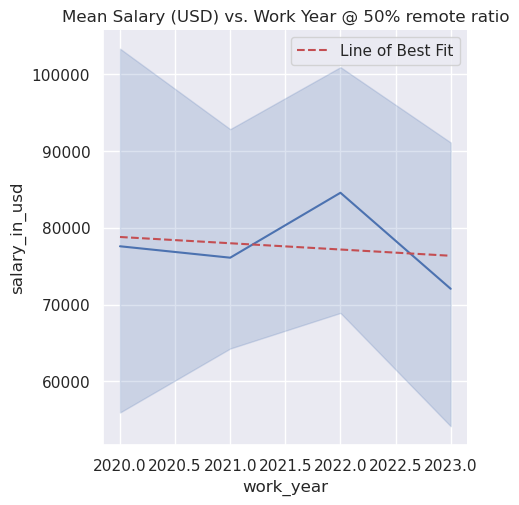

In [144]:


sns.relplot(
    data=df_rm50,
    x='work_year',
    y='salary_in_usd',
    kind='line',
        ).set(title='Mean Salary (USD) vs. Work Year @ 50% remote ratio')

y = df.groupby(df.remote_ratio).get_group(50).groupby(df.work_year).salary_in_usd.mean()
slope, intercept, r_value, p_value, std_err = spy.stats.linregress(x, y)
linfit = lambda a : slope*a + intercept
best_fit = [linfit(xi) for xi in x]
plt.plot(x, best_fit, '--r', label='Line of Best Fit')
plt.legend()

print(f'f(x) = {slope}x + {intercept}')
print(f'R2 = {r_value**2}')
print(f'p_value = {p_value}')

plt.savefig(f'{my_folder}mean salary vs time for remote 50.svg')